# Sonification development notebook

## 1. Setup

In [1]:
%reload_ext autoreload 
%autoreload 2
import sys
import os
sys.path.append('../')
from phonon_sonification import MP_interface
import matplotlib.pyplot as plt
from strauss.sonification import Sonification
from strauss.sources import Events, Objects
from strauss import channels
from strauss.score import Score
from strauss.generator import Spectralizer
import IPython.display as ipd
from scipy.interpolate import interp1d
import numpy as np
import pathlib
import scipy
%matplotlib inline

In [2]:
Cs3Sb_data = MP_interface.dos_stats_analysis("mp-10378",temp=[0,50,100,150,200,250,300,350,400,450])

cannot calculate stats for 0K
There are 22 imaginary frequencies which have not been processed


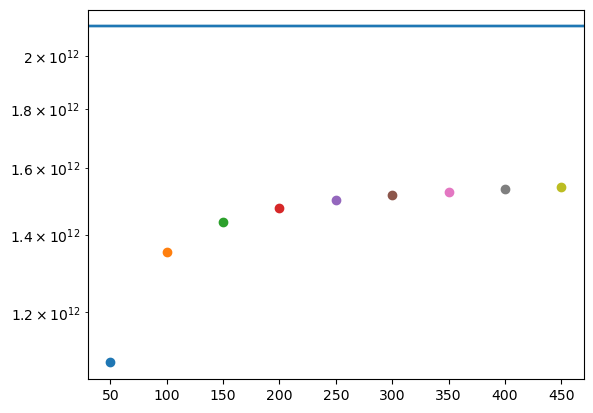

In [138]:
for temp in Cs3Sb_data['projection']['Cs_1']['stats']['thermal']:
    plt.scatter(int(temp), Cs3Sb_data['projection']['Cs_1']['stats']['thermal'][temp]['band_centre'])
    plt.axhline(Cs3Sb_data['projection']['Cs_1']['stats']['athermal']['band_centre'] / )
    plt.yscale("log")

In [51]:
from phonon_sonification import phonon_frequency_mapping

In [53]:
f_ph = 4.2
fmin_ph = 0.1
fmax_ph = 8.0

phonon_frequency_mapping.phonon_to_note(f_ph,fmin_ph,fmax_ph)

{'phonon_frequency': 4.2,
 'audible_frequency': 569.0831341171298,
 'note': 'C#',
 'octave': 5}

In [54]:
f_ph = 7
phonon_frequency_mapping.phonon_to_note(f_ph,fmin_ph,fmax_ph)

{'phonon_frequency': 7,
 'audible_frequency': 1162.3154496059626,
 'note': 'D',
 'octave': 6}

In [56]:
f_ph = 0.1
phonon_frequency_mapping.phonon_to_note(f_ph,fmin_ph,fmax_ph)

{'phonon_frequency': 0.1, 'audible_frequency': 200.0, 'note': 'G', 'octave': 3}

In [15]:
Cs3Sb_data['projection']['all']

{'densities': array([0.25483426, 0.36981191, 0.50081298, 0.6376157 , 0.76925672,
        0.88655777, 0.98355901, 1.05756031, 1.10820557, 1.13632124,
        1.14303996, 1.12939065, 1.09627144, 1.04463196, 0.97575988,
        0.89171357, 0.79601939, 0.69460692, 0.5966052 , 0.51434369,
        0.46203612, 0.45325127, 0.49804347, 0.60097656, 0.76091867,
        0.97260012, 1.2290513 , 1.52362292, 1.85044804, 2.20281392,
        2.56984477, 2.93300322, 3.26481094, 3.53216253, 3.70497933,
        3.7677954 , 3.72870507, 3.61955062, 3.48505044, 3.36531382,
        3.28117211, 3.23055538, 3.19693061, 3.16296122, 3.12014372,
        3.06958726, 3.0160496 , 2.96128917, 2.90171998, 2.83134227,
        2.74724053, 2.65357083, 2.56123476, 2.48346389, 2.4304017 ,
        2.4063694 , 2.411289  , 2.44458085, 2.50849516, 2.6091893 ,
        2.75612637, 2.9610413 , 3.23630434, 3.59101288, 4.02388676,
        4.51511514, 5.02219812, 5.48466955, 5.83881098, 6.03825985,
        6.07271233, 5.97636546, 5.8

In [32]:
Cs3Sb_data = MP_interface.dos_stats_analysis("mp-10378",temp=list(np.arange(1,100,1)))

There are 22 imaginary frequencies which have not been processed


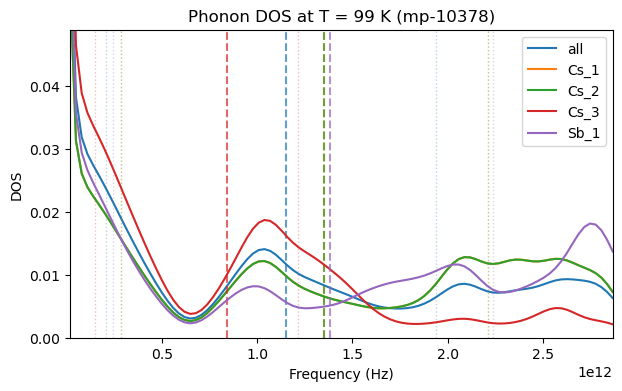

In [43]:
from IPython.display import HTML

anim = MP_interface.animate_dos_vs_temperature(Cs3Sb_data)

HTML(anim.to_jshtml())


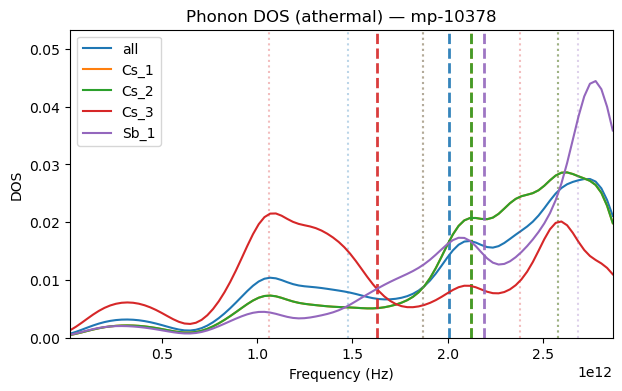

In [49]:
MP_interface.plot_dos_at_temperature(Cs3Sb_data, T=None)

What I want to do:

Using the strauss python library for sonification write a python script that sonifies the data in the dictionary. Each projection maps to a timbre (e.g. string, brass, organ), each projected band centre maps to a sound frequency (will need to shift down into audible frequency range, and play around with the mapping - e.g. logarithmic mapping), each projected total dos maps to an amplitude, the quantiles map to the LFO modulation (in frequency or sound). The user can specify a single temperature for unchanging sound, or a temperature range which will then sweep through pitch. I also want to have "choral mode" where everything in in voice.
